In [1]:
import numpy as np
import matplotlib.pyplot as plt

import sys
sys.path.append('/home/diogo/miniforge3/envs/core_neuron/lib/python')
from neuron import h

from netpyne import sim, specs
import seaborn as sns
import pickle as pkl
import pandas as pd
from scipy import stats as st
import h5py
import os

In [ ]:
def _neuron_distance_setup(hobj):
    hobj.push()
    h.distance(0, 0.0)
    h.pop_section()


def _neuron_distance(hobj, x):
    hobj.push()
    d = h.distance(x)
    h.pop_section()
    return d


def _get_longest_branch(hobjs):
    max_L = 0.0
    for hobj in hobjs:
        sref = h.SectionRef(sec=hobj)
        if sref.nchild() == 0:
            d = _neuron_distance(hobj, 1)
            if d > max_L:
                max_L = d
    if max_L == 0.0 and hobjs:
        max_L = _neuron_distance(hobjs[0], 1)
    return max_L


def _locate_sites(hobjs, site):
    hits = []
    for hobj in hobjs:
        d0 = _neuron_distance(hobj, 0)
        d1 = _neuron_distance(hobj, 1)
        if d0 > d1:
            d0, d1 = d1, d0
        if d1 <= d0:
            continue
        if d0 <= site <= d1:
            x = (site - d0) / (d1 - d0)
            x = max(0.01, min(0.99, x))
            hits.append((hobj, x))
    return hits



# Keep point-process objects alive for the full simulation.
_OU_REFS = []

# Distinct namespace for Gfluct2 Random123 streams.
_OU_STREAM_TAG = 0x4F550000
_UINT32_MASK = 0xFFFFFFFF


def insert_ou_noise(sim_obj, cfg_obj, sing_cell_param):
    """Insert CoreNEURON 9.0.1-compatible OU conductance noise."""
    n_total = 0
    type_basal = {}
    type_apical = {}
    type_n_cells = {}

    global_seed = int(cfg_obj.GLOBALSEED) & _UINT32_MASK

    for cell in sim_obj.net.cells:
        cell_type = cell.tags.get("cellType", "")
        gou = sing_cell_param[cell_type]["GOU"]
        gid_seed = int(cell.gid) & _UINT32_MASK

        idx = 0
        n_basal = 0
        n_apical = 0

        def _place_ou(hobj, x_pos, relpos_for_g, site_id):
            g_val = gou * np.exp(relpos_for_g)
            ou = h.Gfluct2(x_pos, sec=hobj)

            ou.E_e = 0.0
            ou.E_i = -80.0
            ou.g_e0 = g_val
            ou.g_i0 = 0.0
            ou.std_e = g_val
            ou.std_i = 0.0
            ou.tau_e = 65.0
            ou.tau_i = 20.0

            # In NEURON 9.0.1, set RANDOM stream properties through the
            # NMODLRandom wrapper instead of random_setids() in the MOD file.
            stream_id3 = (_OU_STREAM_TAG + int(site_id)) & _UINT32_MASK
            ou.rng.set_ids(global_seed, gid_seed, stream_id3)
            ou.rng.set_seq(0)

            _OU_REFS.append(ou)

        dend_secs = [name for name in cell.secs if name.startswith("dend")]
        if dend_secs:
            dend_hobjs = [cell.secs[name]["hObj"] for name in dend_secs]
            _neuron_distance_setup(dend_hobjs[0])
            max_L = _get_longest_branch(dend_hobjs)

            for basal_index, (hobj, x) in enumerate(
                _locate_sites(dend_hobjs, 0.5 * max_L)
            ):
                if cell.gid >= 0:
                    _place_ou(
                        hobj,
                        x,
                        relpos_for_g=0.5,
                        site_id=5 + basal_index,
                    )
                idx += 1
                n_basal += 1

        if "PYR" in cell_type:
            apic_secs = [name for name in cell.secs if name.startswith("apic")]
            if apic_secs:
                apic_hobjs = [cell.secs[name]["hObj"] for name in apic_secs]
                _neuron_distance_setup(apic_hobjs[0])
                max_L_apic = _get_longest_branch(apic_hobjs)

                for apical_index, relpos in enumerate((0.1, 0.3, 0.5, 0.7, 0.9)):
                    hits = _locate_sites(apic_hobjs, relpos * max_L_apic)
                    if not hits:
                        hits = [(apic_hobjs[0], min(relpos, 0.9))]

                    best_hobj, best_x = max(
                        hits,
                        key=lambda item: item[0](item[1]).diam,
                    )
                    if cell.gid >= 0:
                        _place_ou(
                            best_hobj,
                            best_x,
                            relpos_for_g=relpos,
                            site_id=apical_index,
                        )
                    idx += 1
                    n_apical += 1

        n_total += idx
        type_basal[cell_type] = type_basal.get(cell_type, 0) + n_basal
        type_apical[cell_type] = type_apical.get(cell_type, 0) + n_apical
        type_n_cells[cell_type] = type_n_cells.get(cell_type, 0) + 1

    for cell_type in sorted(type_basal):
        n_cells = type_n_cells[cell_type]
        basal_per_cell = type_basal[cell_type] // n_cells
        apical_per_cell = type_apical.get(cell_type, 0) // n_cells
        g_basal_ps = sing_cell_param[cell_type]["GOU"] * np.exp(0.5) * 1e6
        # Optional diagnostics:
        # print(
        #     f"[OU] {cell_type}: {basal_per_cell} basal/cell, "
        #     f"{apical_per_cell} apical/cell, "
        #     f"g_e0_basal={g_basal_ps:.1f} pS"
        # )

    return n_total


# ---------------------------------------------------------------------------
# 3.  Helper: insert tonic GABA inhibition per cell
# ---------------------------------------------------------------------------
def insert_tonic_gaba(sim_obj, cfg_obj, sing_cell_param):
    """Insert tonic GABA (tonic.mod) into soma/basal of all cells,
    and into apical of PYR cells."""
    for cell in sim_obj.net.cells:
        if cell.gid >= 0: # compare with LFPy
            cell_type = cell.tags.get('cellType', '')
            p = sing_cell_param[cell_type]

            if cfg_obj.DRUG:
                g_soma = p['drug_tonic']
                g_apic = p['drug_apic_tonic']
            else:
                g_soma = p['norm_tonic']
                g_apic = p['apic_tonic']

            for sname in [s for s in cell.secs if s.startswith('soma')]:
                sec = cell.secs[sname]['hObj']
                sec.insert('tonic')
                for seg in sec:
                    seg.tonic.g      = g_soma
                    seg.tonic.e_gaba = -75.0

            for sname in [s for s in cell.secs if s.startswith('dend')]:
                sec = cell.secs[sname]['hObj']
                sec.insert('tonic')
                for seg in sec:
                    seg.tonic.g      = g_soma
                    seg.tonic.e_gaba = -75.0

            if 'PYR' in cell_type:
                for sname in [s for s in cell.secs if s.startswith('apic')]:
                    sec = cell.secs[sname]['hObj']
                    sec.insert('tonic')
                    for seg in sec:
                        seg.tonic.g      = g_apic
                        seg.tonic.e_gaba = -75.0

    # print(f'[init] Inserted tonic GABA into {len(sim_obj.net.cells)} cells.')


# **CONFIGURATION**

In [3]:
# =============================================================================
# cfg.py  —  SimConfig for L23Net NetPyNE Replica (Yao et al. 2022)
# =============================================================================
cfg = specs.SimConfig()
cfg.coreneuron = True
cfg.gpu = True
# ---------------------------------------------------------------------------
# Identity / I/O
# ---------------------------------------------------------------------------
cfg.simLabel = 'v1_jupyter'
cfg.saveFolder = '../data/' + cfg.simLabel

cfg.savePickle = True
cfg.saveJson = False

cfg.verbose = False
cfg.hParams = {'celsius': 34, 'v_init': -80}  
cfg.verbose = False
cfg.createNEURONObj = True
cfg.createPyStruct = True
cfg.cvode_active = False
cfg.cache_efficient = True
cfg.printRunTime = 0.5

cfg.includeParamsLabel = False
cfg.printPopAvgRates = True
cfg.checkErrors = False

# ---------------------------------------------------------------------------
# Simulation timing
# ---------------------------------------------------------------------------
cfg.duration = 1000.0    # ms
cfg.dt       = 0.025     # ms  (40 kHz)

# ---------------------------------------------------------------------------
# Random seeds
# ---------------------------------------------------------------------------
cfg.seeds = {'conn':  1234, 'stim':  1234, 'loc':   1234, 'cell':  1234}
cfg.GLOBALSEED = 1234
cfg.DRUG = False

# ---------------------------------------------------------------------------
# LFP recording electrode (only used when cfg.rec_LFP = True)
# ---------------------------------------------------------------------------
# cfg.recordLFP = [[0.0, 0.0, 5.0]]

# ---------------------------------------------------------------------------
# Recording — one soma trace per population
# GID layout (full run): PYR 0-799, SST 800-849, PV 850-919, VIP 920-999
# ---------------------------------------------------------------------------


circuit_params = pd.read_excel('Circuit_param.xls', sheet_name = None, index_col = 0)
N_HL23PYR = int(circuit_params['SING_CELL_PARAM'].at['cell_num','HL23PYR'])
N_HL23SST = int(circuit_params['SING_CELL_PARAM'].at['cell_num','HL23SST'])
N_HL23PV = int(circuit_params['SING_CELL_PARAM'].at['cell_num','HL23PV'])
N_HL23VIP = int(circuit_params['SING_CELL_PARAM'].at['cell_num','HL23VIP'])

N_cells = N_HL23PYR + N_HL23SST + N_HL23PV + N_HL23VIP

cell_indices_to_plot = [0, 1, 
                        N_HL23PYR, N_HL23PYR + 1, 
                        N_HL23PYR + N_HL23SST, N_HL23PYR + N_HL23SST + 1, 
                        N_HL23PYR + N_HL23SST + N_HL23PV, N_HL23PYR + N_HL23SST + N_HL23PV + 1]
    
cell_indices_to_plot = [i for i in range(4)]

cfg.recordCells  = cell_indices_to_plot
cfg.recordTraces = {'V_soma': {'sec': 'soma_0', 'loc': 0.5, 'var': 'v'},

                    'tonic_i': {
                        'sec': 'soma_0',
                        'loc': 0.5,
                        "mech":"tonic",
                        'var': 'i'
                    },

                    'tonic_o': {
                        'sec': 'soma_0',
                        'loc': 0.5,
                        "mech":"tonic",
                        'var': 'o'
                    },

                    'tonic_c': {
                        'sec': 'soma_0',
                        'loc': 0.5,
                        "mech":"tonic",
                        'var': 'c'
                    },

                    'tonic_a': {
                        'sec': 'soma_0',
                        'loc': 0.5,
                        "mech":"tonic",
                        'var': 'a'
                    },

                    'tonic_b': {
                        'sec': 'soma_0',
                        'loc': 0.5,
                        "mech":"tonic",
                        'var': 'b'}
                        }

cfg.cellNumber = {}
cfg.cellNumber['HL23PYR'] = N_HL23PYR
cfg.cellNumber['HL23SST'] = N_HL23SST
cfg.cellNumber['HL23PV'] = N_HL23PV
cfg.cellNumber['HL23VIP'] = N_HL23VIP

cfg.cellNumber0 = {}
cfg.cellNumber0['HL23PYR'] = 0
cfg.cellNumber0['HL23SST'] = N_HL23PYR
cfg.cellNumber0['HL23PV'] = N_HL23PYR + N_HL23SST
cfg.cellNumber0['HL23VIP'] = N_HL23PYR + N_HL23SST + N_HL23PV


cfg.cellTypeByIndex = {}

for pop, start in cfg.cellNumber0.items():
    for gid in range(start, start + cfg.cellNumber[pop]):
        cfg.cellTypeByIndex[gid] = pop


# LFPy conn distribution comparation
cfg.gExc = 0.945 # The factor ~0.945 compensates for the main conn difference if cfg.LOAD_MATRIX_LFPy = False
cfg.LOAD_MATRIX_LFPy = False # need run LFPy in ../data/L23Net_LFPy
cfg.invertedYCoord = False
cfg.ROTATE_Y = True
cfg.Change_axon_names = True

#------------------------------------------------------------------------------
# Analysis and plotting 
# ------------------------------------------------------------------------------

Ipops = ['HL23SST', 'HL23PV', 'HL23VIP']
Epops = ['HL23PYR']

cfg.allpops = Epops + Ipops

cfg.recordStep = cfg.dt    # record every time step


#------------------------------------------------------------------------------
# General network parameters
#------------------------------------------------------------------------------
cfg.scale = 1.0 # reduce size
cfg.sizeY = 3300.0
cfg.sizeX = 500.0 # r = 250 um 
cfg.sizeZ = 500.0

# NetParams

In [4]:
#------------------------------------------------------------------------------
#
# NETWORK PARAMETERS
#
#------------------------------------------------------------------------------

# L23 Human net
# #              L2/3   L4     L5
PYRmaxApics = [550   ,1550   ,1900]
uppers =      [-250  ,-1200 ,-1600]
lowers =      [-1200 ,-1580 ,-2300]

L25_human = 250 + 950 + 380 + 720 + 1000
Human_height = 3300.0

netParams = specs.NetParams()   # object of class NetParams to store the network parameters

#------------------------------------------------------------------------------
# General network parameters
#------------------------------------------------------------------------------
netParams.scale = cfg.scale # Scale factor for number of cells
netParams.sizeX = cfg.sizeX # x-dimension (horizontal length) size in um
netParams.sizeY = cfg.sizeY # y-dimension (vertical height or cortical depth) size in um
netParams.sizeZ = cfg.sizeZ # z-dimension (horizontal depth) size in um
netParams.shape = 'cylinder' # cylindrical (column-like) volume
netParams.rotateCellsRandomly = True # rotate cell morphologies randomly along vertical axis (to avoid alignment artifacts)
   
cellModels = ['HH_full']

Ipops = ['HL23SST', 'HL23PV', 'HL23VIP']
Epops = ['HL23PYR']

layer = {'1':[0.0, 250.0], '23': [250.0,1200.0], '23soma': [-1500.0,-550.0], '4':[1200.0,1580.0], '5': [1580.0,2300.0], '6': [2300.0,3300.0]}  # normalized layer boundaries

#------------------------------------------------------------------------------
# General connectivity parameters
#------------------------------------------------------------------------------
netParams.defaultThreshold = -10.0 # spike threshold, 10 mV is NetCon default, lower it for all cells
# netParams.defaultDelay = 0.1 # default conn delay (ms)
# netParams.propVelocity = 300.0 #  300 μm/ms (Stuart et al., 1997)
# netParams.scaleConnWeightNetStims = 0.001  # weight conversion factor (from nS to uS)

# ---------------------------------------------------------------------------
# Paths (relative to NetPyNE_Replica_Yao/ working directory)
# ---------------------------------------------------------------------------
MODELS_DIR = 'models'

# =============================================================================
# SECTION 1: Cell Parameters (cellParams)
#
# Each cell type has a standalone wrapper HOC template (HL23XXX_Cell.hoc) that:
#   1. Loads the cell-specific SWC morphology (path hardcoded in the template)
#   2. Runs geom_nseg()
#   3. Applies the correct axon policy (delete_axon or delete_axon_BPO)
#   4. Calls biophys() — all channel insertions are done inside init()
#
# A single importCellParams call per cell type is sufficient.
# importCellParams instantiates the template, then scans h.allsec() to capture
# all section geometry + mechanisms into the cellParams secs dict.
# =============================================================================


for cell_name in cfg.allpops:
    wrapper_hoc   = os.path.join(MODELS_DIR, f'{cell_name}_Cell.hoc')
    template_name = cell_name + '_Cell'

    cellRule = netParams.importCellParams(
        label          = cell_name,
        fileName       = wrapper_hoc,
        cellName       = template_name,
        importSynMechs = False,
        somaAtOrigin   = True,
    )

    # Tag the rule so popParams can reference it by condition
    netParams.cellParams[cell_name]['conds'] = {
        'cellType':  cell_name,
        'cellModel': 'HH_full',
    }

    # Define named section lists for connParams compartment targeting.
    # These mirror the SWC section types used in the original HOC model.
    secs = netParams.cellParams[cell_name]['secs']
    apic_secs  = sorted([s for s in secs if s.startswith('apic')])
    dend_secs  = sorted([s for s in secs if s.startswith('dend')])
    soma_secs  = sorted([s for s in secs if s.startswith('soma')])
    axon_secs  = sorted([s for s in secs if s.startswith('axon') or s.startswith('myelin')])

    netParams.cellParams[cell_name]['secLists'] = {
        'all':     soma_secs + dend_secs + apic_secs + axon_secs,
        'spiny':   dend_secs + apic_secs,
        'somatic': soma_secs,
        'basal':   dend_secs,
        'apical':  apic_secs,
        'axonal':  axon_secs,
        # 'spiny' used internally; SYN_POS=0 is split into two rules
    }

# ----------------------------------------------------------------------------------------------------------------------- #
# Rotate to z as vertical
# ----------------------------------------------------------------------------------------------------------------------- #
if cfg.ROTATE_Y:

    rotate_x = {}
    rotate_y = {}
    rotate_z = {}
    rotate_x['HL23PYR'], rotate_x['HL23SST'], rotate_x['HL23PV'], rotate_x['HL23VIP'] = 1.57, 1.77, 1.26, -1.57
    rotate_y['HL23PYR'], rotate_y['HL23SST'], rotate_y['HL23PV'], rotate_y['HL23VIP'] = 2.62, 2.77, 2.57, 3.57
    rotate_z['HL23PYR'], rotate_z['HL23SST'], rotate_z['HL23PV'], rotate_z['HL23VIP'] = 0.0, 0.0, 0.0, 0.0


    for cellName in netParams.cellParams.keys():

        cellType = netParams.cellParams[cellName]['conds']['cellType']

        x = rotate_x[cellType]
        y = rotate_y[cellType]
        z = rotate_z[cellType]

        for sectName in netParams.cellParams[cellName]['secs'].keys():

            sectParams_new = netParams.cellParams[cellName]['secs'][sectName]['geom']['pt3d']
            sectParams = []

            theta = -x
            rotation_x = np.array([[1, 0, 0],
                                        [0, np.cos(theta), -np.sin(theta)],
                                        [0, np.sin(theta), np.cos(theta)]])
            
            # print(cellName,sectName,len(sectParams_new))
            # print(sectParams_new)       
            
            for i in range(len(sectParams_new)):
                x3d, y3d, z3d, L3d = sectParams_new[i]
                rel_pos = x3d, y3d, z3d

                # print(rel_pos)        
                rel_pos = np.dot(rel_pos, rotation_x)
                # print(rel_pos)
                pt3d = (rel_pos[0],rel_pos[1] , rel_pos[2], L3d)
                sectParams.append(pt3d)

            netParams.cellParams[cellName]['secs'][sectName]['geom']['pt3d'] = sectParams


            sectParams_new = netParams.cellParams[cellName]['secs'][sectName]['geom']['pt3d']
            sectParams = []

            phi = -y
            rotation_y = np.array([[np.cos(phi), 0, np.sin(phi)],
                                        [0, 1, 0],
                                        [-np.sin(phi), 0, np.cos(phi)]])
            
            for i in range(len(sectParams_new)):
                x3d, y3d, z3d, L3d = sectParams_new[i]
                rel_pos = x3d, y3d, z3d

                # print(rel_pos)        
                rel_pos = np.dot(rel_pos, rotation_y)
                # print(rel_pos)
                pt3d = (rel_pos[0],rel_pos[1] , rel_pos[2], L3d)
                sectParams.append(pt3d)

            netParams.cellParams[cellName]['secs'][sectName]['geom']['pt3d'] = sectParams


            sectParams_new = netParams.cellParams[cellName]['secs'][sectName]['geom']['pt3d']
            sectParams = []

            gamma = -z
            rotation_z = np.array([[np.cos(gamma), -np.sin(gamma), 0],
                                        [np.sin(gamma), np.cos(gamma), 0],
                                        [0, 0, 1]])
        
            for i in range(len(sectParams_new)):
                x3d, y3d, z3d, L3d = sectParams_new[i]
                rel_pos = x3d, y3d, z3d

                # print(rel_pos)        
                rel_pos = np.dot(rel_pos, rotation_z)
                # print(rel_pos)
                pt3d = (rel_pos[0],rel_pos[1] , rel_pos[2], L3d)
                sectParams.append(pt3d)

            netParams.cellParams[cellName]['secs'][sectName]['geom']['pt3d'] = sectParams

    # ----------------------------------------------------------------------------------------------------------------------- #
    # Rotate to Y as vertical axis
    # ----------------------------------------------------------------------------------------------------------------------- #

    rotate_x = {}
    rotate_y = {}
    rotate_z = {}
    rotate_x['HL23PYR'], rotate_x['HL23SST'], rotate_x['HL23PV'], rotate_x['HL23VIP'] = -1.5708, -1.5708, -1.5708, -1.5708
    rotate_y['HL23PYR'], rotate_y['HL23SST'], rotate_y['HL23PV'], rotate_y['HL23VIP'] = 0.0, 0.0, 0.0, 0.0
    rotate_z['HL23PYR'], rotate_z['HL23SST'], rotate_z['HL23PV'], rotate_z['HL23VIP'] = 0.0, 0.0, 0.0, 0.0


    for cellName in netParams.cellParams.keys():

        cellType = netParams.cellParams[cellName]['conds']['cellType']

        x = rotate_x[cellType]
        y = rotate_y[cellType]
        z = rotate_z[cellType]

        for sectName in netParams.cellParams[cellName]['secs'].keys():

            sectParams_new = netParams.cellParams[cellName]['secs'][sectName]['geom']['pt3d']
            sectParams = []

            theta = -x
            rotation_x = np.array([[1, 0, 0],
                                        [0, np.cos(theta), -np.sin(theta)],
                                        [0, np.sin(theta), np.cos(theta)]])
            
            # print(cellName,sectName,len(sectParams_new))
            # print(sectParams_new)       
            
            for i in range(len(sectParams_new)):
                x3d, y3d, z3d, L3d = sectParams_new[i]
                rel_pos = x3d, y3d, z3d

                # print(rel_pos)        
                rel_pos = np.dot(rel_pos, rotation_x)
                # print(rel_pos)
                pt3d = (rel_pos[0],rel_pos[1] , rel_pos[2], L3d)
                sectParams.append(pt3d)

            netParams.cellParams[cellName]['secs'][sectName]['geom']['pt3d'] = sectParams


            sectParams_new = netParams.cellParams[cellName]['secs'][sectName]['geom']['pt3d']
            sectParams = []

            phi = -y
            rotation_y = np.array([[np.cos(phi), 0, np.sin(phi)],
                                        [0, 1, 0],
                                        [-np.sin(phi), 0, np.cos(phi)]])
            
            for i in range(len(sectParams_new)):
                x3d, y3d, z3d, L3d = sectParams_new[i]
                rel_pos = x3d, y3d, z3d

                # print(rel_pos)        
                rel_pos = np.dot(rel_pos, rotation_y)
                # print(rel_pos)
                pt3d = (rel_pos[0],rel_pos[1] , rel_pos[2], L3d)
                sectParams.append(pt3d)

            netParams.cellParams[cellName]['secs'][sectName]['geom']['pt3d'] = sectParams


            sectParams_new = netParams.cellParams[cellName]['secs'][sectName]['geom']['pt3d']
            sectParams = []

            gamma = -z
            rotation_z = np.array([[np.cos(gamma), -np.sin(gamma), 0],
                                        [np.sin(gamma), np.cos(gamma), 0],
                                        [0, 0, 1]])
        
            for i in range(len(sectParams_new)):
                x3d, y3d, z3d, L3d = sectParams_new[i]
                rel_pos = x3d, y3d, z3d

                # print(rel_pos)        
                rel_pos = np.dot(rel_pos, rotation_z)
                # print(rel_pos)
                pt3d = (rel_pos[0],rel_pos[1] , rel_pos[2], L3d)
                sectParams.append(pt3d)

            netParams.cellParams[cellName]['secs'][sectName]['geom']['pt3d'] = sectParams


if cfg.Change_axon_names:
    #------------------------------------------------------------------------------
    # Change axon names
    #------------------------------------------------------------------------------
    # print and rename
    for cellName in netParams.cellParams.keys():
            
        if 'myelin_0' in netParams.cellParams[cellName]['secs'].keys():

            netParams.renameCellParamsSec(label=cellName, oldSec='myelin_0', newSec='axon_2')      
                
            for secname2 in netParams.cellParams[cellName]['secLists'].keys():
                if 'myelin_0' in netParams.cellParams[cellName]['secLists'][secname2]:
                    # print('old ->',cellName,secname2,netParams.cellParams[cellName]['secLists'][secname2][-1])
                    netParams.cellParams[cellName]['secLists'][secname2][-1] = 'axon_2'    
                    # print('new ->',cellName,secname2,netParams.cellParams[cellName]['secLists'][secname2][-1])


# =============================================================================
# SECTION 3: Population Parameters (popParams)
# L2/3 spatial geometry from original circuit.py:
#   upper = -250 µm, lower = -1200 µm  (z-axis, soma depth)
#   cylinder radius = 250 µm in x-y
# =============================================================================

if cfg.LOAD_MATRIX_LFPy:   
    
    OUTPUTPATH = "../data/L23Net_LFPy/Circuit_output/"
    filename = os.path.join(OUTPUTPATH,'cell_positions_and_rotations.h5')

    popDataArray = {}
    popDataArray[cfg.allpops[0]] = pd.read_hdf(filename,cfg.allpops[0])
    popDataArray[cfg.allpops[0]] = popDataArray[cfg.allpops[0]].sort_values('gid')
    popDataArray[cfg.allpops[1]] = pd.read_hdf(filename,cfg.allpops[1])
    popDataArray[cfg.allpops[1]] = popDataArray[cfg.allpops[1]].sort_values('gid')
    popDataArray[cfg.allpops[2]] = pd.read_hdf(filename,cfg.allpops[2])
    popDataArray[cfg.allpops[2]] = popDataArray[cfg.allpops[2]].sort_values('gid')
    popDataArray[cfg.allpops[3]] = pd.read_hdf(filename,cfg.allpops[3])
    popDataArray[cfg.allpops[3]] = popDataArray[cfg.allpops[3]].sort_values('gid')

    for cellName in cfg.allpops:
        cellsList = []
        for i in range(0,len(popDataArray[cellName]['gid'])):
            # cellsList.append({'x': 10.0*i, 'y': popDataArray[cellName]['z'][i], 'z': 100.0})
            cellsList.append({'x': popDataArray[cellName]['y'][i], 'y': popDataArray[cellName]['z'][i], 'z': popDataArray[cellName]['x'][i]})
        netParams.popParams[cellName] = {'cellType': cellName, 'cellsList': cellsList, 'cellModel': 'HH_full'}
    

else:
    L23_UPPER  = -250   # µm
    L23_LOWER  = -1200  # µm
    L23_RADIUS =  250   # µm
    L23_UPPER_soma  = -550   # µm
    L23_LOWER_soma = -1500  # µm

    for cellName in cfg.allpops:

        num_cells = cfg.cellNumber[cellName]

        netParams.popParams[cellName] = {
            'cellType':  cellName,
            'cellModel': 'HH_full',
            'numCells':  num_cells,
            'xRange': [0, 2*L23_RADIUS],
            'zRange': [0, 2*L23_RADIUS],
            'yRange': layer['23soma'],
        }

# print(netParams.popParams)

# =============================================================================
# SECTION 3: Synaptic Mechanism Parameters (synMechParams)
# Two main point-process synapses (with STP) + background noise + tonic GABA.
# STP parameters (Dep, Fac, Use, gmax) vary per connection and are overridden
# in connParams using a per-connection synMechParams list.
# =============================================================================

#------------------------------------------------------------------------------
#Import Excel file
circuit_params = pd.read_excel('Circuit_param.xls', sheet_name = None, index_col = 0)

#Get cell names and import biophys
cell_names = [i for i in circuit_params['conn_probs'].axes[0]]

circuit_params["syn_params"] = {'none':{'tau_r_AMPA': 0,'tau_d_AMPA': 0,'tau_r_NMDA': 0,
                                'tau_d_NMDA': 0, 'e': 0,'Dep': 0,'Fac': 0,'Use': 0,'u0':0,'gmax': 0}}
circuit_params["multi_syns"] = {'none':{'loc':0,'scale':0}}

# organizing dictionary for LFPY input
for pre in cell_names:
    for post in cell_names:
        if "PYR" in pre:
            circuit_params["syn_params"][pre+post] = {'tau_r_AMPA': 0.3, 'tau_d_AMPA': 3, 'tau_r_NMDA': 2,
                                                      'tau_d_NMDA': 65, 'e': 0, 'u0':0,
                                                      'Dep': circuit_params["Depression"].at[pre, post],
                                                      'Fac': circuit_params["Facilitation"].at[pre, post],
                                                      'Use': circuit_params["Use"].at[pre, post],
                                                      'gmax': circuit_params["syn_cond"].at[pre, post]}
        else:
            circuit_params["syn_params"][pre+post] = {'tau_r': 1, 'tau_d': 10, 'e': -80, 'u0':0,
                                                      'Dep': circuit_params["Depression"].at[pre, post],
                                                      'Fac': circuit_params["Facilitation"].at[pre, post],
                                                      'Use': circuit_params["Use"].at[pre, post],
                                                      'gmax': circuit_params["syn_cond"].at[pre, post]}
        circuit_params["multi_syns"][pre+post] = {'loc':int(circuit_params["n_cont"].at[pre, post]),'scale':0}

#------------------------------------------------------------------------------

halfnorm_rv = st.halfnorm
uniform_rv = st.uniform

#              L2/3   L4     L5
PYRmaxApics = [550   ,1550   ,1900]
uppers =      [-250  ,-1200 ,-1600]
lowers =      [-1200 ,-1580 ,-2300]

depths = []
rangedepths = []
minSynLocs = []
syn_pos = []
pop_args = {}

for i in range (3):
    depths.append((lowers[i]-uppers[i])/2-PYRmaxApics[i])
    rangedepths.append(abs(lowers[i]-uppers[i])/2)
    minSynLocs.append((lowers[i]-uppers[i])/2*3-PYRmaxApics[i])

# Excitatory: ProbAMPANMDA (AMPA + NMDA dual-exponential with Fuhrmann STP)
netParams.synMechParams['Exc'] = {
    'mod':        'ProbAMPANMDA',
    'tau_r_AMPA': 0.3,
    'tau_d_AMPA': 3.0,
    'tau_r_NMDA': 2.0,
    'tau_d_NMDA': 65.0,
    'e':          0.0,
    'u0':         0.0,
    'Dep':        670.0,   # overridden per connection in connParams
    'Fac':        17.0,
    'Use':        0.46,
    'gmax':       0.000248,
}

# Inhibitory: ProbUDFsyn (GABA-A dual-exponential with Fuhrmann STP)
netParams.synMechParams['Inh'] = {
    'mod':   'ProbUDFsyn',
    'tau_r': 1.0,
    'tau_d': 10.0,
    'e':     -80.0,
    'u0':    0.0,
    'Dep':   710.0,   # overridden per connection in connParams
    'Fac':   23.0,
    'Use':   0.08,
    'gmax':  0.002910,
}

# Ornstein-Uhlenbeck background noise: Gfluct2
# Inserted per-section via custom function in init.py; listed here for reference.
netParams.synMechParams['Gfluct2'] = {
    'mod':   'Gfluct2',
    'E_e':   0.0,
    'E_i':   -80.0,
    'g_e0':  0.0,
    'g_i0':  0.0,
    'std_e': 0.0,
    'std_i': 0.0,
    'tau_e': 65.0,
    'tau_i': 20.0,
}

# Tonic GABA: tonic.mod  (steady-state shunting conductance)
# Inserted as distributed mechanism in init.py; listed here for reference.
netParams.synMechParams['TonicGABA'] = {
    'mod':    'tonic',
    'e_gaba': -75.0,
}

# =============================================================================
# SECTION 4: Connectivity Parameters (connParams)
# One rule per (pre, post) pair = up to 16 rules (skip zero-prob pairs).
#
# Synaptic target section determined by SYN_POS index:
#   0 → apic + dend  (split into two sub-rules, each at prob * 0.5)
#   1 → apical
#   2 → basal (dend)
#   3 → basal (dend, proximal-biased in original; approximated as uniform here)
#
# Per-connection STP parameters override the base synMechParams defaults.
# =============================================================================

#------------------------------------------------------------------------------
# SynMechParams
#------------------------------------------------------------------------------

for pre in cfg.allpops:
    for post in cfg.allpops:
        
        Syn_pos = int(circuit_params['Syn_pos'].at[pre, post])


        if circuit_params['conn_probs'].at[pre, post] > 0.0:

            if "PYR" in pre: # Excitatory
                netParams.synMechParams[pre+post] = {'mod': 'ProbAMPANMDA',
                                                        'tau_r_AMPA': 0.3, 'tau_d_AMPA': 3.0, 'tau_r_NMDA': 2.0,
                                                        'tau_d_NMDA': 65.0,
                                                        'e':          0.0,
                                                        'u0':         0.0,
                                                        'Dep': circuit_params["Depression"].at[pre, post],
                                                        'Fac': circuit_params["Facilitation"].at[pre, post],
                                                        'Use': circuit_params["Use"].at[pre, post],
                                                        'gmax': circuit_params["syn_cond"].at[pre, post],
                                                        }
                if int(circuit_params['Syn_pos'].at[pre, post]) == 0 and cfg.LOAD_MATRIX_LFPy == False:
                    netParams.synMechParams[pre+post]['gmax'] = cfg.gExc*circuit_params["syn_cond"].at[pre, post]
                    print("cfg.LOAD_MATRIX_LFPy == False, correction factor applied in Exc-Exc coonections gmax*= ", cfg.gExc)                                
            else:
                netParams.synMechParams[pre+post] = {'mod': 'ProbUDFsyn',
                                                        'tau_r': 1, 'tau_d': 10,
                                                        'e':     -80.0,
                                                        'u0':    0.0,
                                                        'Dep': circuit_params["Depression"].at[pre, post],
                                                        'Fac': circuit_params["Facilitation"].at[pre, post],
                                                        'Use': circuit_params["Use"].at[pre, post],
                                                        'gmax': circuit_params["syn_cond"].at[pre, post],
                                                    }

#------------------------------------------------------------------------------
# ConnParams
#------------------------------------------------------------------------------
if cfg.LOAD_MATRIX_LFPy:   
    OUTPUTPATH = "../data/L23Net_LFPy/Circuit_output/"
    filename = os.path.join(OUTPUTPATH,'synapse_connections.h5')
    f = h5py.File(filename, 'r')

for pre in cfg.allpops:
    for post in cfg.allpops:
        
        if circuit_params['conn_probs'].at[pre, post] > 0.0:        

            if cfg.LOAD_MATRIX_LFPy:   

                synloc2 = {}
                synsec2 = {}
                matrix = {}
                for i in range(cfg.cellNumber[post]):
                    matrix[i] = [] 
                    synloc2[i] = [] 
                    synsec2[i] = []  

                for vec in list(f[pre+':'+post]):
                    gid_pre,  gid , weight, delay, sec, secx, x, y, z = vec
                    section = str(sec).split(".")[1].split("[")[0] + "_" + str(sec).split(".")[1].split("[")[1][:-2]
                    # print(section+"_"+str(secx))
                    synsec2[gid-cfg.cellNumber0[post]].append(section)
                    synloc2[gid-cfg.cellNumber0[post]].append(secx)
                    matrix[gid-cfg.cellNumber0[post]].append([gid_pre-cfg.cellNumber0[pre],gid-cfg.cellNumber0[post]])

                pre2post = []
                synloc = []
                synsec = []
                for i in range(cfg.cellNumber[post]):
                    for j,conn in enumerate(matrix[i]):
                        pre2post.append(conn)
                        synsec.append(synsec2[i][j])
                        synloc.append(synloc2[i][j])

                # print(pre+':'+post, len(pre2post),len(synloc),len(synsec))


                netParams.connParams[pre + '->' + post] = {'preConds': {'cellType': pre}, 
                                                            'postConds': {'cellType': post},
                                                            'synMech': pre+post,
                                                            'connList': pre2post,
                                                            'weight': 1.0,         # synaptic weight 
                                                            'delay': 0.5,      # transmission delay (ms) 
                                                            'synsPerConn': int(1.0),
                                                            'sec': synsec,
                                                            'loc': synloc,
                                                            }     


            else:             
                netParams.connParams[pre + '->' + post] = {'preConds': {'cellType': pre}, 
                                                            'postConds': {'cellType': post},  #  E -> all (100-1000 um) ,'y': [0,5000]
                                                            'probability': circuit_params['conn_probs'].at[pre, post],                  # probability of connection
                                                            'weight': 1.0,         # synaptic weight 
                                                            'delay': 0.5,      # transmission delay (ms) 
                                                            'synMech': pre+post,
                                                            'synsPerConn': int(circuit_params['n_cont'].at[pre, post]),
                                                            'sec': 'spiny',
                                                            }  
                                
                if int(circuit_params['Syn_pos'].at[pre, post]) == 1:
                    netParams.connParams[pre + '->' + post]['sec'] = 'apical'
                elif int(circuit_params['Syn_pos'].at[pre, post]) > 1:
                    netParams.connParams[pre + '->' + post]['sec'] = 'basal'

cfg.LOAD_MATRIX_LFPy == False, correction factor applied in Exc-Exc coonections gmax*=  0.945


# Sim configuration

In [5]:
from mpi4py import MPI
from params.circuit_params import CELL_NAMES, SING_CELL_PARAM

#MPI variables:
COMM = MPI.COMM_WORLD
SIZE = COMM.Get_size()
RANK = COMM.Get_rank()
GLOBALSEED = int(cfg.GLOBALSEED)

# Create new RandomState for each RANK
SEED = GLOBALSEED*10000
np.random.seed(SEED + RANK)
local_state = np.random.RandomState(SEED + RANK)
halfnorm_rv = st.halfnorm
halfnorm_rv.random_state = local_state
uniform_rv = st.uniform
uniform_rv.random_state = local_state

# Create new RandomState for each RANK
SEED = GLOBALSEED*10000
np.random.seed(SEED + RANK)
local_state = np.random.RandomState(SEED + RANK)
halfnorm_rv = st.halfnorm
halfnorm_rv.random_state = local_state
uniform_rv = st.uniform
uniform_rv.random_state = local_state

sim.initialize(
    simConfig = cfg, 	
    netParams = netParams)  				# create network object and set cfg and net params
sim.net.createPops()               			# instantiate network populations
sim.net.createCells()              			# instantiate network cells based on defined populations

for metype in sim.net.cells:
    # print('cell ->', metype.tags['cellType'], metype.tags['cellModel'], metype.tags['pop'])
    if metype.tags['cellType'] == 'HL23PYR':
        metype.secs['axon_0']['hObj'](0.1).diam = 2.875
        metype.secs['axon_0']['hObj'](0.3).diam = 2.625
        metype.secs['axon_0']['hObj'](0.5).diam = 2.375
        metype.secs['axon_0']['hObj'](0.7).diam = 2.125
        metype.secs['axon_0']['hObj'](0.9).diam = 1.875

        metype.secs['axon_1']['hObj'](0.0714286).diam = 1.6964285714285714
        metype.secs['axon_1']['hObj'](0.214286).diam = 1.5892857142857142
        metype.secs['axon_1']['hObj'](0.357143).diam = 1.4821428571428572
        metype.secs['axon_1']['hObj'](0.5).diam = 1.375
        metype.secs['axon_1']['hObj'](0.642857).diam = 1.2678571428571428
        metype.secs['axon_1']['hObj'](0.785714).diam = 1.1607142857142856
        metype.secs['axon_1']['hObj'](0.928571).diam = 1.0535714285714286

    if metype.tags['cellType'] == 'HL23SST':
        metype.secs['axon_0']['hObj'](0.1).diam = 2.875
        metype.secs['axon_0']['hObj'](0.3).diam = 2.625
        metype.secs['axon_0']['hObj'](0.5).diam = 2.375
        metype.secs['axon_0']['hObj'](0.7).diam = 2.125
        metype.secs['axon_0']['hObj'](0.9).diam = 1.875

        metype.secs['axon_1']['hObj'](0.0714286).diam = 1.6964285714285714
        metype.secs['axon_1']['hObj'](0.214286).diam = 1.5892857142857142
        metype.secs['axon_1']['hObj'](0.357143).diam = 1.4821428571428572
        metype.secs['axon_1']['hObj'](0.5).diam = 1.375
        metype.secs['axon_1']['hObj'](0.642857).diam = 1.2678571428571428
        metype.secs['axon_1']['hObj'](0.785714).diam = 1.1607142857142856
        metype.secs['axon_1']['hObj'](0.928571).diam = 1.0535714285714286


# Also load net_functions.hoc so HOC helpers are available at cell-build time.
h.load_file('net_functions.hoc')

_OU_REFS = []   # keeps HocObjects alive for entire simulation lifetime


# ---------------------------------------------------------------------------
# 5.  Build and run simulation
# ---------------------------------------------------------------------------

#print('[init] Inserting background noise (Gfluct2) ...')
insert_ou_noise(sim, cfg, SING_CELL_PARAM)

# print('[init] Inserting tonic GABA inhibition ...')
insert_tonic_gaba(sim, cfg, SING_CELL_PARAM)

sim.cfg.distributeSynsUniformly = False

# print('[init] Creating connections ...')
sim.net.connectCells()

# print('[init] Adding external stimuli ...')
sim.net.addStims()

# print('[init] Setting up recording ...')
sim.setupRecording()


****************************************************************************
* hwloc 2.13.0 received invalid information.
*
* Failed with error: intersection without inclusion
* while inserting Group0 (P#16 subtype Cluster groupkind 222-0 cpuset 0x00000f00)
* at L1d (P#16 cpuset 0x00000104)
* coming from: linux:sysfs:cluster
*
* The following FAQ entry in the hwloc documentation may help:
*   What should I do when hwloc reports "operating system" warnings?
* Otherwise please report this error message to the hwloc user's mailing list,
* along with the files generated by the hwloc-gather-topology script.
* 
* hwloc will now ignore this invalid topology information and continue.
****************************************************************************



Start time:  2026-07-31 18:12:01.928119





Creating network of 4 cell populations on 1 hosts...: 100%|##########|


  Number of cells on node 0: 100 
  Done; cell creation time = 1.08 s.
Making connections...


  HL23PYR->HL23PYR: 100%|##########| Creating synaptic connections for 80/80 postsynaptic cells on node 0 (probabilistic connectivity)
  HL23PYR->HL23SST: 100%|##########| Creating synaptic connections for 5/5 postsynaptic cells on node 0 (probabilistic connectivity)
  HL23PYR->HL23PV: 100%|##########| Creating synaptic connections for 7/7 postsynaptic cells on node 0 (probabilistic connectivity)
  HL23PYR->HL23VIP: 100%|##########| Creating synaptic connections for 8/8 postsynaptic cells on node 0 (probabilistic connectivity)
  HL23SST->HL23PYR: 100%|##########| Creating synaptic connections for 80/80 postsynaptic cells on node 0 (probabilistic connectivity)
  HL23SST->HL23SST: 100%|##########| Creating synaptic connections for 5/5 postsynaptic cells on node 0 (probabilistic connectivity)
  HL23SST->HL23PV: 100%|##########| Creating synaptic connections for 7/7 postsynaptic cells on node 0 (probabilistic connectivity)
  HL23SST->HL23VIP: 100%|##########| Creating synaptic connections 

  Number of connections on node 0: 1280 
  Number of synaptic contacts on node 0: 6541 
  Done; cell connection time = 0.28 s.
  Number of stims on node 0: 0 
  Done; cell stims creation time = 0.00 s.
Recording 24 traces of 6 types on node 0


{spkt: Vector[0], spkid: Vector[1], V_soma: {cell_0: Vector[2], cell_1: Vector[8], cell_2: Vector[14], cell_3: Vector[20]}, tonic_i: {cell_0: Vector[3], cell_1: Vector[9], cell_2: Vector[15], cell_3: Vector[21]}, tonic_o: {cell_0: Vector[4], cell_1: Vector[10], cell_2: Vector[16], cell_3: Vector[22]}, tonic_c: {cell_0: Vector[5], cell_1: Vector[11], cell_2: Vector[17], cell_3: Vector[23]}, tonic_a: {cell_0: Vector[6], cell_1: Vector[12], cell_2: Vector[18], cell_3: Vector[24]}, tonic_b: {cell_0: Vector[7], cell_1: Vector[13], cell_2: Vector[19], cell_3: Vector[25]}, t: Vector[26], _repr_mimebundle_: {}}

# Run simulation

In [6]:
sim.runSim()

sim.gatherData()

# sim.saveData()

# sim.analysis.plotData()           		# plot spikes, V traces, rasters, etc.

 
 Duke, Yale, and the BlueBrain Project -- Copyright 1984-2020
 Version : 9.0.1 b12a541 (2025-11-14 17:57:06 +0100)
 
 Additional mechanisms from files
 CaDynamics.mod Ca_HVA.mod Ca_LVA.mod Gfluct.mod Ih.mod Im.mod K_P.mod K_T.mod Kv3_1.mod NMDA.mod NaTg.mod Nap.mod ProbAMPANMDA.mod ProbUDFsyn.mod SK.mod epsp.mod exp2syn.mod expsyn.mod hh.mod netstim.mod passive.mod pattern.mod stim.mod svclmp.mod tonic.mod



0.0s

Running simulation using CoreNEURON for 1000.0 ms...
 Info : 1 GPUs shared by 1 ranks per node
 Memory (MBs) :             After mk_mech : Max 623.6953, Min 623.6953, Avg 623.6953 
 GPU Memory (MiBs) : Used = 2107.812500, Free = 30000.125000, Total = 32107.937500
 Memory (MBs) :            After MPI_Init : Max 623.6953, Min 623.6953, Avg 623.6953 
 GPU Memory (MiBs) : Used = 2107.812500, Free = 30000.125000, Total = 32107.937500
 Memory (MBs) :          Before nrn_setup : Max 623.7070, Min 623.7070, Avg 623.7070 
 GPU Memory (MiBs) : Used = 2107.812500, Free = 30000.125000, Total = 32107.937500
best_balance=0.9084 ncell=100 ntype=4 nwarp=100
 Setup Done   : 0.06 seconds 
 Model size   : 16.38 MB
 Memory (MBs) :          After nrn_setup  : Max 663.6484, Min 663.6484, Avg 663.6484 
 GPU Memory (MiBs) : Used = 2107.812500, Free = 30000.125000, Total = 32107.937500
GENERAL PARAMETERS
--mpi=false
--mpi-lib=
--gpu=true
--dt=0.025
--tstop=1000

GPU
--nwarp=65536
--cell-permute=2
--cuda-

{spkt: [39.05000000010032, 40.07500000010055, 43.00000000010122, 45.325000000101745, 47.57500000010226, 48.50000000010247, 48.87500000010255, 49.20000000010263, 50.10000000010283, 50.57500000010294, 51.90000000010324, 52.32500000010334, 52.90000000010347, 53.10000000010351, 53.12500000010352, 53.22500000010354, 53.25000000010355, 53.57500000010362, 53.65000000010364, 54.55000000010384, 54.55000000010384, 54.57500000010385, 54.87500000010392, 54.92500000010393, 54.97500000010394, 55.02500000010395, 55.20000000010399, 55.32500000010402, 55.400000000104036, 55.62500000010409, 55.65000000010409, 55.925000000104156, 56.82500000010436, 56.92500000010438, 57.12500000010443, 57.25000000010446, 57.47500000010451, 57.67500000010455, 57.775000000104576, 57.80000000010458, 57.900000000104605, 58.00000000010463, 58.45000000010473, 58.80000000010481, 58.92500000010484, 59.175000000104895, 59.32500000010493, 59.60000000010499, 59.85000000010505, 59.925000000105065, 59.97500000010508, 60.0000000001050

In [7]:
data = sim.allSimData
spkt = np.array(sim.simData['spkt'])
spkid = np.array(sim.simData['spkid'])
neuronType = cfg.cellTypeByIndex
popRate = data['popRates']
print(popRate)

{HL23PYR: 1.8125, HL23SST: 3.6, HL23PV: 5.714285714285714, HL23VIP: 1.25}


In [8]:
popRate

{HL23PYR: 1.8125, HL23SST: 3.6, HL23PV: 5.714285714285714, HL23VIP: 1.25, _repr_mimebundle_: {}}

In [9]:
data.keys()

dict_keys(['spkt', 'spkid', 'V_soma', 'tonic_i', 'tonic_o', 'tonic_c', 'tonic_a', 'tonic_b', 't', '_repr_mimebundle_', '_repr_html_', '_repr_markdown_', '_repr_svg_', '_repr_png_', '_repr_pdf_', '_repr_jpeg_', '_repr_latex_', '_repr_json_', '_repr_javascript_', 'popRates', 'avgRate'])

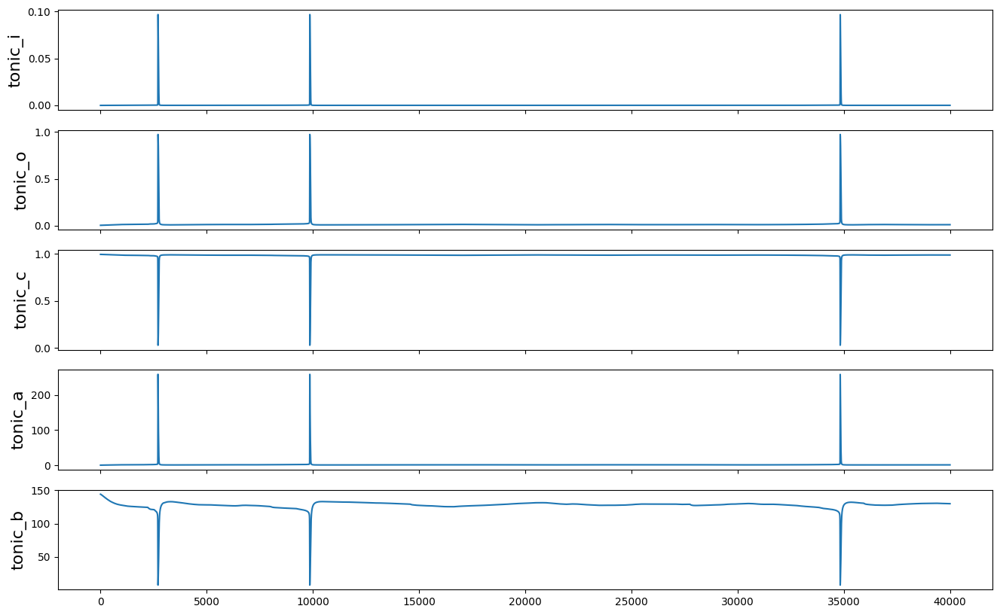

In [10]:
['tonic_i', 'tonic_o', 'tonic_c', 'tonic_a', 'tonic_b']

fig, axes = plt.subplots(5,1, figsize = (16,10), sharex=True)

for i, name in enumerate(['tonic_i', 'tonic_o', 'tonic_c', 'tonic_a', 'tonic_b']):
    axes[i].plot(data[name]['cell_0'])
    axes[i].set_ylabel(name, fontsize = 16)
    # if name == 'tonic_i':
    #     axes[i].set_ylim(-0.001,0.001)

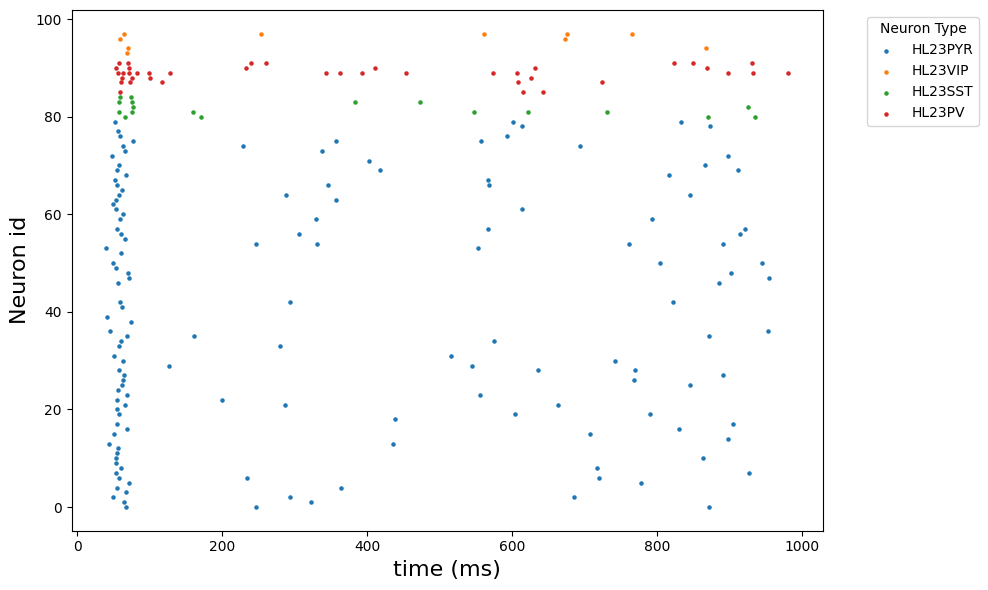

In [11]:
unique_types = set(neuronType.values())

plt.figure(figsize=(10, 6))

for cell_type in unique_types:
    valid_ids = [nid for nid, ctype in neuronType.items() if ctype == cell_type]
    mask = np.isin(spkid, valid_ids)
    plt.scatter(spkt[mask], spkid[mask], label=cell_type, s=5)

plt.xlabel('time (ms)', fontsize = 16)
plt.ylabel('Neuron id', fontsize = 16)


plt.legend(title='Neuron Type', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout() # Ensures the legend isn't cut off when saving

plt.show()

Text(0, 0.5, 'V (mV)')

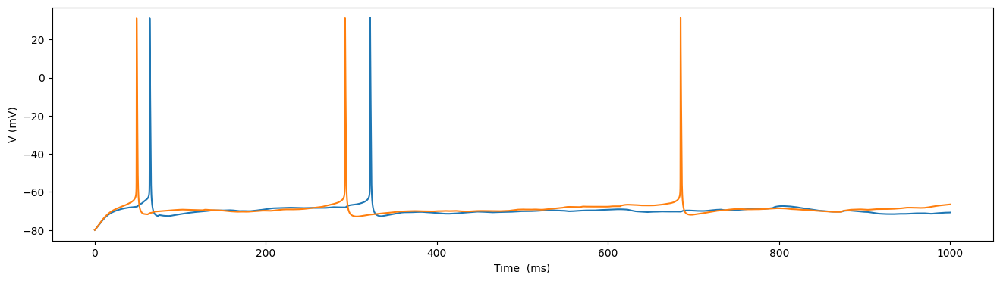

In [12]:
plt.figure(figsize=(16,4))
t = np.linspace(0.0, cfg.duration, len(data['V_soma']['cell_3']))
plt.plot(t, data['V_soma']['cell_1'])
plt.plot(t, data['V_soma']['cell_2'])
plt.xlabel('Time  (ms)')
plt.ylabel('V (mV)')
